In [32]:
# import os
# os.environ["CUDA_HOME"] = "/cm/shared/apps/cuda11.8/toolkit/11.8.0"
# os.environ["PATH"] = "/cm/shared/apps/cuda11.8/toolkit/11.8.0/bin:" + os.environ.get("PATH", "")
# os.environ["LD_LIBRARY_PATH"] = "/cm/shared/apps/cuda11.8/toolkit/11.8.0/lib64:" + os.environ.get("LD_LIBRARY_PATH", "")


from ultralytics import YOLO
from sahi.slicing import slice_image
from ensemble_boxes import weighted_boxes_fusion
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import torch
import torchvision.ops as ops

In [42]:
# -- Configuration -- edit these before running
MODEL_PATH    = "/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/runs/detect/3200px_training_v4/cfu_detector/weights/best.pt"
IMAGE_DIR     = "/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/data/split_AI/test/images"
# GRID / OVERLAP_RATIO are read from the tiled dataset the model was trained on,
# so inference tiling always matches training — no need to re-type them each run.
# Point this at the tiled_* folder whose tiling_settings.txt you want to use.
TILED_DIR     = "/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/data/tiled_3200_v4"

CONF          = 0.25
IOU           = 0.1
METHOD        = 'wbf'   # 'nms' or 'wbf'

CLASS_NAMES = ['BFU', 'GM', 'E', 'GEMM']
COLORS      = ['#e6194b', '#3cb44b', '#4363d8', '#f58231']


def load_tiling_settings(tiled_dir):
    """Read GRID + OVERLAP_RATIO from a training_prep tiling_settings.txt so
    inference tiling matches how the training tiles were produced."""
    path = Path(tiled_dir) / "tiling_settings.txt"
    settings = {}
    for line in path.read_text().splitlines():
        if ":" in line:
            key, val = line.split(":", 1)
            settings[key.strip()] = val.strip()
    grid = int(settings["grid"].lower().split("x")[0])   # "2x2" -> 2
    overlap_ratio = float(settings["overlap_ratio"])
    return grid, overlap_ratio

TILE_SETTINGS = False
if TILE_SETTINGS:
    GRID, OVERLAP_RATIO = load_tiling_settings(TILED_DIR)
    print(f"Tiling from {Path(TILED_DIR).name}/tiling_settings.txt -> "
        f"GRID={GRID}, OVERLAP_RATIO={OVERLAP_RATIO}")
else:
    GRID = 1
    OVERLAP_RATIO = 0.0
    print(f"GRID={GRID}, OVERLAP_RATIO={OVERLAP_RATIO}")


GRID=1, OVERLAP_RATIO=0.0


In [43]:
model = YOLO(MODEL_PATH)
# model.to('cuda:0')
print(f"Loaded model from {MODEL_PATH}")

Loaded model from /Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/runs/detect/3200px_training_v4/cfu_detector/weights/best.pt


In [44]:
def predict_full_image(image_path, conf=CONF, iou=IOU, grid=GRID,
                       overlap_ratio=OVERLAP_RATIO, method=METHOD):
    """
    Tiles a full-resolution image, runs inference on each tile, remaps boxes
    to original image coordinates, then merges duplicates using either NMS or WBF.

    method: 'nms' — keeps the highest-confidence box, discards overlapping ones
            'wbf' — merges overlapping boxes by averaging their coordinates
    """
    img = Image.open(image_path)
    W, H = img.size
    tile_w = W // grid
    tile_h = H // grid

    slice_result = slice_image(
        image=str(image_path),
        slice_height=tile_h,
        slice_width=tile_w,
        overlap_height_ratio=overlap_ratio,
        overlap_width_ratio=overlap_ratio,
        verbose=False,
    )

    all_boxes, all_scores, all_labels = [], [], []

    for sliced in slice_result.sliced_image_list:
        tx1 = sliced.starting_pixel[0]
        ty1 = sliced.starting_pixel[1]
        tile_img = Image.fromarray(sliced.image)

        results = model.predict(tile_img, conf=conf, iou=iou, verbose=False)
        for box in results[0].boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            all_boxes.append([x1 + tx1, y1 + ty1, x2 + tx1, y2 + ty1])
            all_scores.append(float(box.conf[0]))
            all_labels.append(int(box.cls[0]))

    if not all_boxes:
        return np.empty((0, 4)), np.array([]), np.array([])

    if method == 'wbf':
        # WBF expects boxes normalized to [0, 1]
        boxes_norm = (np.array(all_boxes) / np.array([W, H, W, H])).clip(0, 1).tolist()
        boxes_out, scores_out, labels_out = weighted_boxes_fusion(
            [boxes_norm],
            [all_scores],
            [all_labels],
            iou_thr=iou,
            skip_box_thr=conf,
        )
        boxes_out = (np.array(boxes_out) * np.array([W, H, W, H]))
        return boxes_out, np.array(scores_out), np.array(labels_out, dtype=int)

    else:  # nms
        boxes_t  = torch.tensor(all_boxes,  dtype=torch.float32)
        scores_t = torch.tensor(all_scores, dtype=torch.float32)
        labels_t = torch.tensor(all_labels, dtype=torch.int32)

        keep_indices = []
        for cls_idx in labels_t.unique():
            mask = labels_t == cls_idx
            keep = ops.nms(boxes_t[mask], scores_t[mask], iou)
            keep_indices.append(mask.nonzero(as_tuple=True)[0][keep])

        keep = torch.cat(keep_indices)
        return boxes_t[keep].numpy(), scores_t[keep].numpy(), labels_t[keep].numpy()

In [45]:
def plot_detections(image_path, boxes, scores, labels, figsize=(14, 14)):
    img = np.array(Image.open(image_path))
    fig, ax = plt.subplots(1, figsize=figsize)
    ax.imshow(img)

    for (x1, y1, x2, y2), score, cls in zip(boxes, scores, labels):
        color = COLORS[cls % len(COLORS)]
        rect  = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                   linewidth=1, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 - 4, f"{CLASS_NAMES[cls]} {score:.2f}",
                color=color, fontsize=6, fontweight='bold')

    counts = {name: int((labels == i).sum()) for i, name in enumerate(CLASS_NAMES)}
    ax.set_title(f"{Path(image_path).name}  |  {counts}")
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [46]:
print(torch.cuda.is_available())
print(next(model.model.parameters()).device)


False
cpu


In [51]:
import random
# Run inference on all images and collect counts
supported   = {'.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp'}
image_paths = sorted(p for p in Path(IMAGE_DIR).iterdir() if p.suffix.lower() in supported)
image_paths_subset = random.sample(image_paths, min(5, len(image_paths)))  # for quick testing
# image_paths_subset = [Path("/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/data/split/test/images/06.17.25_BHEEM-04-Cycle1-Day1_500 CD34+s_plated 05.27.25_B2.jpg"),
#                       Path("/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/data/split/test/images/2025.08.05_S1-01-mPB1-D1-fk_500 CD34+s_plated 07.08.25_4wks_B1.jpg")]
print(f"Found {len(image_paths)} images")

rows = []
all_results = {}

for img_path in image_paths_subset:
    boxes, scores, labels = predict_full_image(img_path)
    all_results[img_path] = (boxes, scores, labels)
    counts = {name: int((labels == i).sum()) for i, name in enumerate(CLASS_NAMES)}
    rows.append({'image': img_path.name, **counts})
    print(f"{img_path.name}: {counts}")

df = pd.DataFrame(rows)
df['total'] = df[CLASS_NAMES].sum(axis=1)

Found 195 images
2025.11.04_S1-02-mPB2-D1-fk_500 CD34+s_plated 10.14.25_3wks_A3.jpg: {'BFU': 5, 'GM': 64, 'E': 1, 'GEMM': 0}
2025.09.18_S1-02-mPB1-D2-fk_500 CD34+s_plated 08.27.25_3wks_B3.jpg: {'BFU': 1, 'GM': 71, 'E': 2, 'GEMM': 0}
2026.03.18_S1-04-mPB1-D2-fk_500 CD34+s_plated 02.25.26_3wks_A2.jpg: {'BFU': 0, 'GM': 91, 'E': 7, 'GEMM': 1}
2026.03.10_S1-04-mPB1-D1-fk_500 CD34+s_plated 02.24.26_2wks #2_B1.jpg: {'BFU': 2, 'GM': 102, 'E': 2, 'GEMM': 0}
2025.09.18_STM04-mPB1-D1-fk_500 CD34+s_plated  09.03.25_2wks_B1.jpg: {'BFU': 0, 'GM': 39, 'E': 3, 'GEMM': 0}


In [52]:
# Summary table
display(df)
print("\nTotals:")
print(df[CLASS_NAMES + ['total']].sum().to_string())

,image,BFU,GM,E,GEMM,total
0,2025.11.04_S1-02-mPB2-D1-fk_500 CD34+s_plated ...,5,64,1,0,70
1,2025.09.18_S1-02-mPB1-D2-fk_500 CD34+s_plated ...,1,71,2,0,74
2,2026.03.18_S1-04-mPB1-D2-fk_500 CD34+s_plated ...,0,91,7,1,99
3,2026.03.10_S1-04-mPB1-D1-fk_500 CD34+s_plated ...,2,102,2,0,106
4,2025.09.18_STM04-mPB1-D1-fk_500 CD34+s_plated ...,0,39,3,0,42



Totals:
BFU        8
GM       367
E         15
GEMM       1
total    391


In [53]:

# Smallest bounding box analysis (across current all_results subset)
all_boxes_flat = np.concatenate([boxes for boxes, scores, labels in all_results.values() if len(boxes) > 0])
widths  = all_boxes_flat[:, 2] - all_boxes_flat[:, 0]
heights = all_boxes_flat[:, 3] - all_boxes_flat[:, 1]
areas   = widths * heights

min_idx = np.argmin(areas)
print(f"Smallest box: {widths[min_idx]:.1f}w x {heights[min_idx]:.1f}h = {areas[min_idx]:.0f} px²")
print(f"Area stats — min: {areas.min():.0f}  median: {np.median(areas):.0f}  max: {areas.max():.0f} px²")


Smallest box: 75.7w x 63.5h = 4808 px²
Area stats — min: 4808  median: 60825  max: 426775 px²


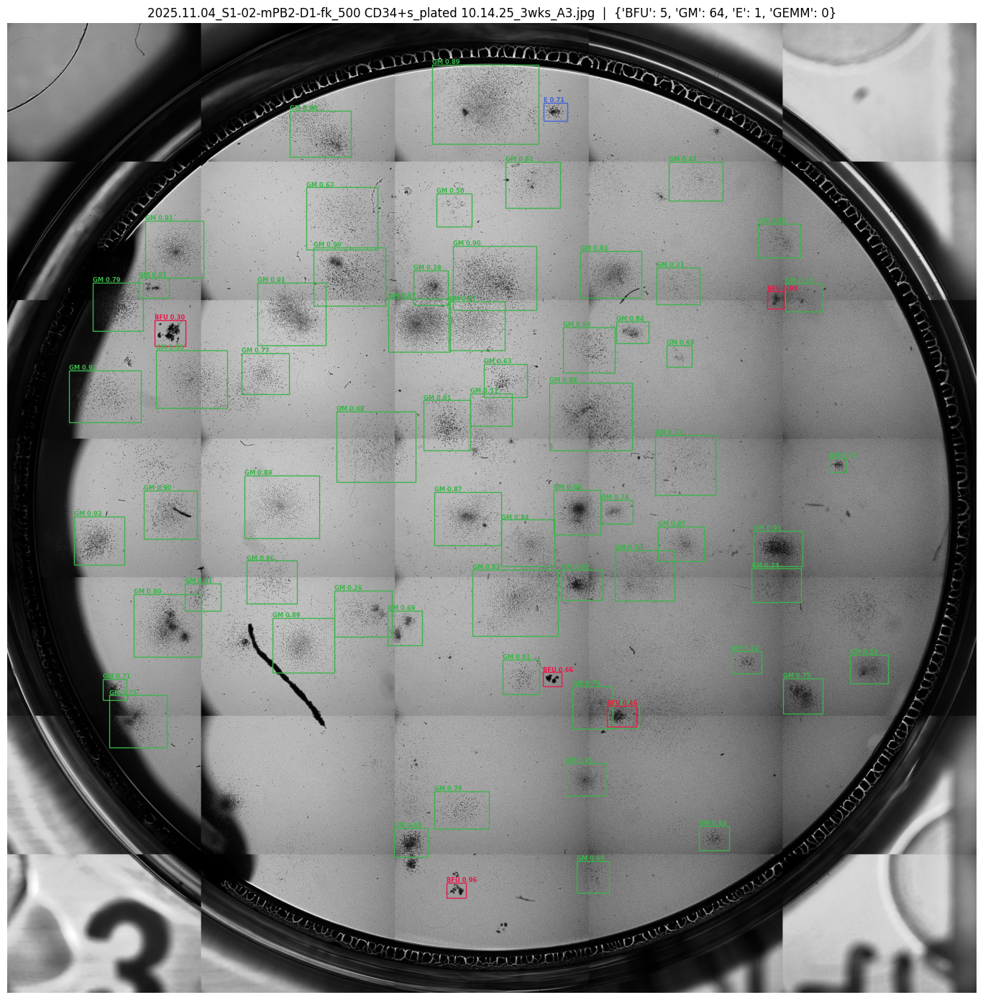

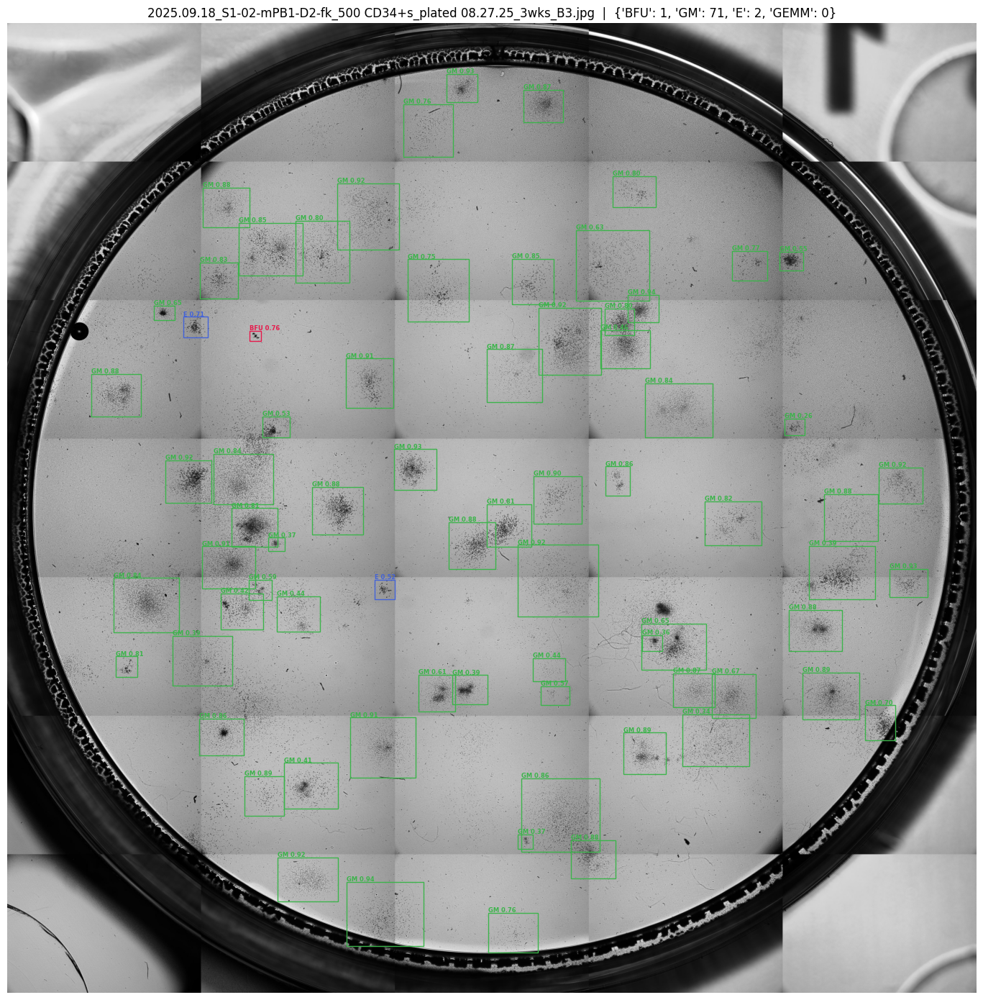

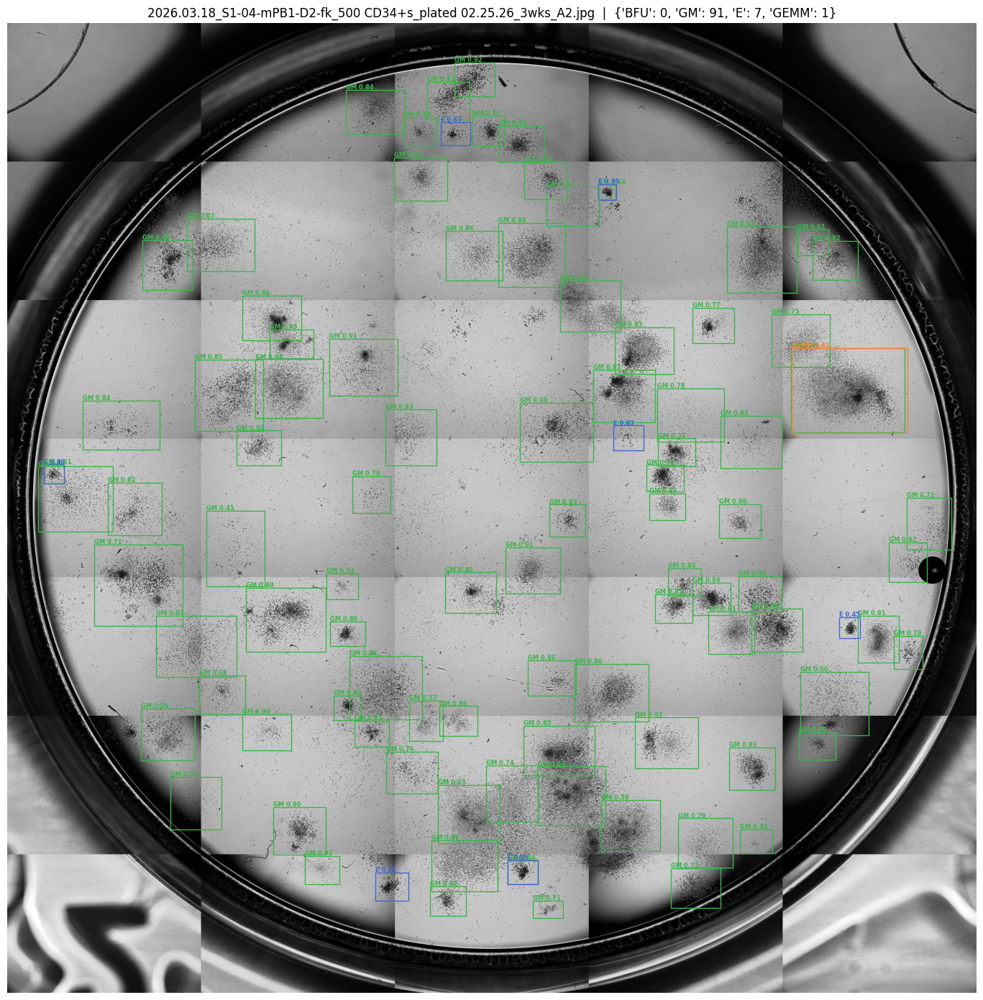

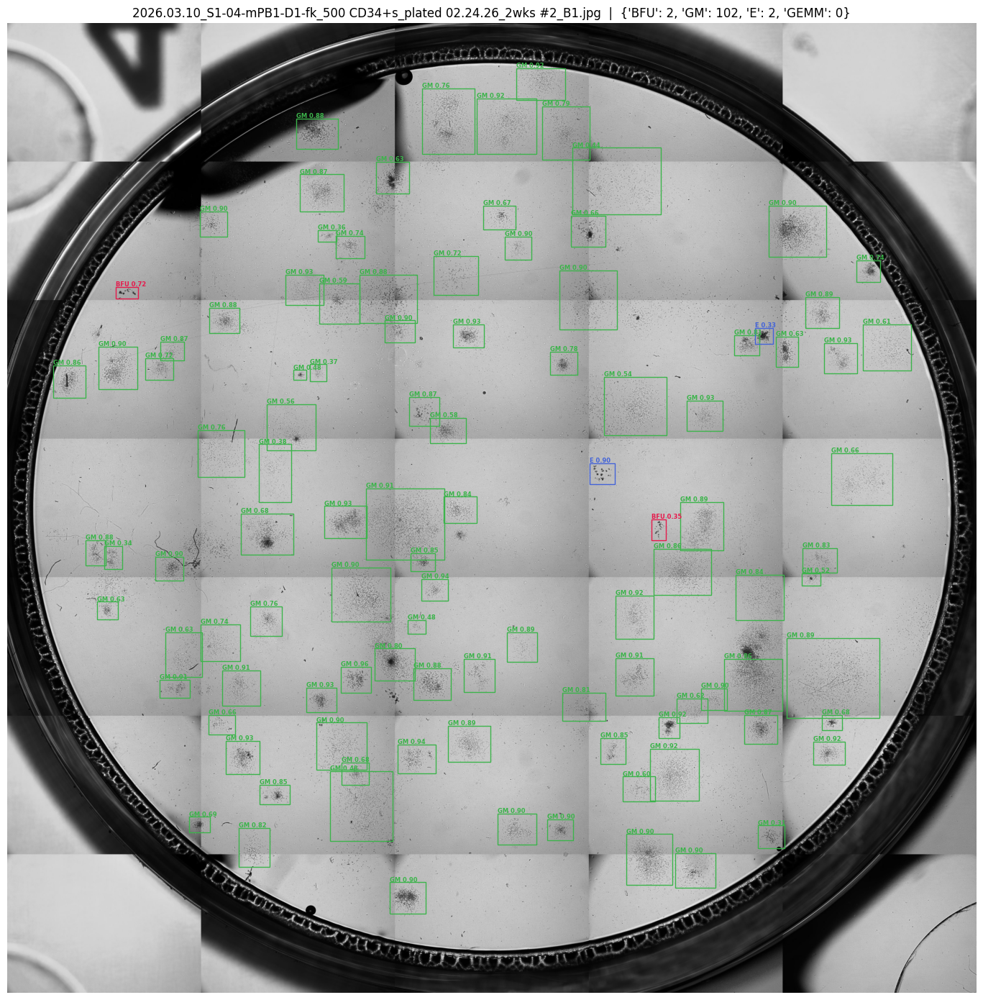

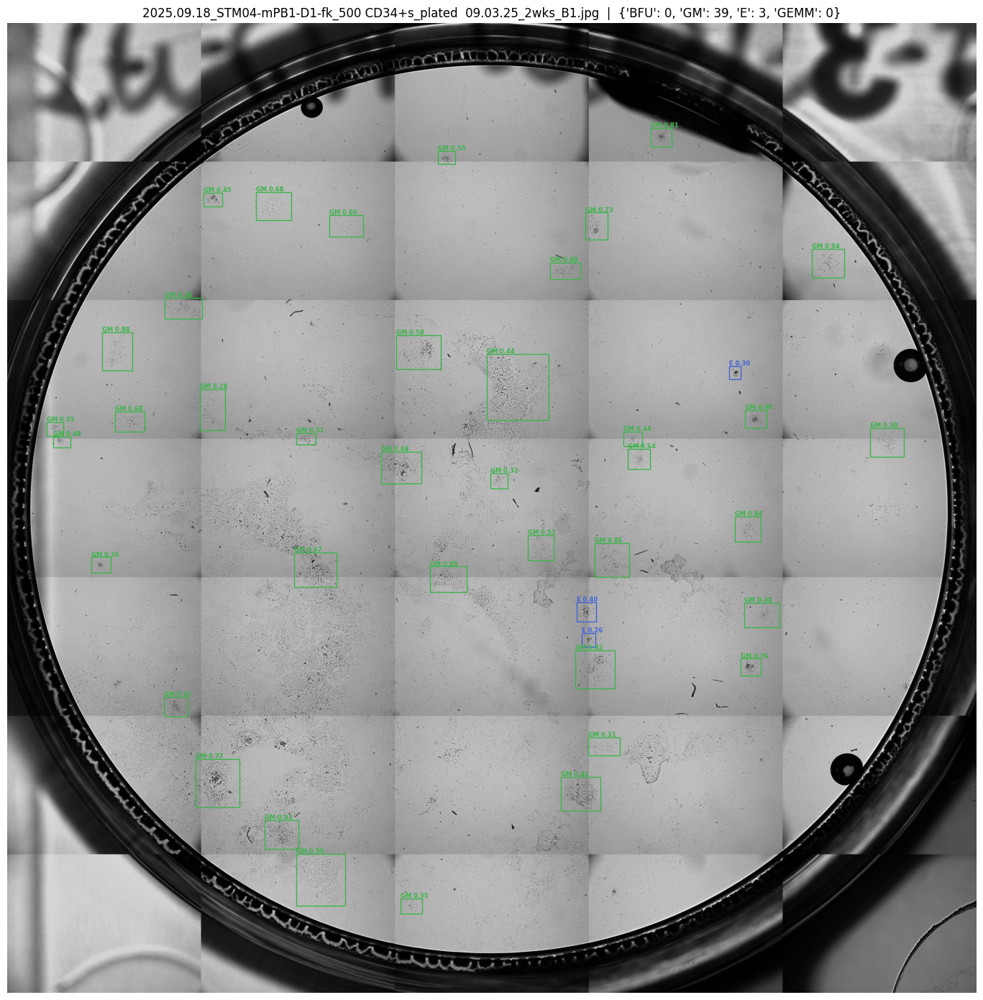

In [54]:
# Visualise detections on each image
for img_path, (boxes, scores, labels) in all_results.items():
    plot_detections(img_path, boxes, scores, labels)

In [ ]:
# # Save counts to CSV
# out_csv = Path("/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/runs/cfu_detector/inference_counts.csv")
# out_csv.parent.mkdir(parents=True, exist_ok=True)
# df.to_csv(out_csv, index=False)
# print(f"Saved counts to {out_csv}")

# # Save annotated images
# out_img_dir = Path("/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/runs/cfu_detector/inference_images")
# out_img_dir.mkdir(parents=True, exist_ok=True)

# for img_path, (boxes, scores, labels) in all_results.items():
#     img = np.array(Image.open(img_path))
#     fig, ax = plt.subplots(1, figsize=(14, 14))
#     ax.imshow(img)

#     for (x1, y1, x2, y2), score, cls in zip(boxes, scores, labels):
#         color = COLORS[cls % len(COLORS)]
#         rect  = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
#                                    linewidth=1, edgecolor=color, facecolor='none')
#         ax.add_patch(rect)
#         ax.text(x1, y1 - 4, f"{CLASS_NAMES[cls]} {score:.2f}",
#                 color=color, fontsize=6, fontweight='bold')

#     counts = {name: int((labels == i).sum()) for i, name in enumerate(CLASS_NAMES)}
#     ax.set_title(f"{img_path.name}  |  {counts}")
#     ax.axis('off')
#     plt.tight_layout()

#     out_path = out_img_dir / img_path.name
#     fig.savefig(out_path, dpi=150, bbox_inches='tight')
#     plt.close(fig)
#     print(f"Saved: {out_path.name}")

# print(f"\nAll annotated images saved to {out_img_dir}")

In [ ]:
# # -- Save predictions as YOLO .txt pre-annotations for labelImg --
# # Runs on ALL images in IMAGE_DIR, skipping any that already have a label file.
# # After running, open the images in labelImg to review and correct predictions.

# LABELS_OUT_DIR = Path("/Users/mzhai72/Desktop/SC-RNA Seq/CFU-classifier/data/split_AI/train/labels")

# supported = {'.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp'}
# all_image_paths = sorted(p for p in Path(IMAGE_DIR).iterdir() if p.suffix.lower() in supported)

# skipped, saved = 0, 0

# for img_path in all_image_paths:
#     label_path = LABELS_OUT_DIR / (img_path.stem + ".txt")

#     # Skip images that are already annotated
#     if label_path.exists():
#         skipped += 1
#         continue

#     img = Image.open(img_path)
#     W, H = img.size 

#     boxes, scores, labels = predict_full_image(img_path)

#     lines = []
#     for (x1, y1, x2, y2), cls in zip(boxes, labels):
#         xc = ((x1 + x2) / 2) / W
#         yc = ((y1 + y2) / 2) / H
#         bw = (x2 - x1) / W
#         bh = (y2 - y1) / H
#         lines.append(f"{int(cls)} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}")

#     with open(label_path, "w") as f:
#         f.write("\n".join(lines) + ("\n" if lines else ""))

#     saved += 1
#     print(f"Saved {len(lines)} boxes -> {label_path.name}")

# print(f"\nDone. {saved} pre-annotated, {skipped} already had labels and were skipped.")

Saved 121 boxes -> 03.24.26_S1-05-PB0_100k PBMCs per well_plated 03.10.26_2wks#2_B2.txt
Saved 65 boxes -> 05.01.25_S1-02-PB0_100k PBMCs per well_plated 04.15.25_16 days_#3 for condensation_B3.txt
Saved 23 boxes -> 05.27.25_S1-03-PB0_100k PBMCs per well_plated 05.12.25_15days_A3.txt
Saved 35 boxes -> 05.27.25_S1-03-PB0_100k PBMCs per well_plated 05.12.25_15days_B1.txt
Saved 33 boxes -> 05.27.25_S1-03-PB0_100k PBMCs per well_plated 05.12.25_15days_B2.txt
Saved 17 boxes -> 05.27.25_S1-03-PB0_100k PBMCs per well_plated 05.12.25_15days_B3.txt
Saved 35 boxes -> 05.28.25_S1-03-PB0_500 CD34+s per well_plated 05.14.25_2wks-retake_A2.txt
Saved 34 boxes -> 05.28.25_S1-03-PB0_500 CD34+s per well_plated 05.14.25_2wks-retake_A3.txt
Saved 27 boxes -> 05.28.25_S1-03-PB0_500 CD34+s per well_plated 05.14.25_2wks-retake_B1.txt
Saved 30 boxes -> 06.04.25_S1-03-BM0_500 CD34+s per well_plated 05.14.25_3wks_A3.txt
Saved 35 boxes -> 06.04.25_S1-03-BM0_500 CD34+s per well_plated 05.14.25_3wks_B1.txt
Saved 31 b